In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm, trange

data = pd.read_csv("output2.csv", encoding="utf-8").fillna(method="ffill")
data.tail(10)

,Sentence #,Word,Tag
415520,18353,們,O
415521,18353,先,O
415522,18353,讓,O
415523,18353,他,O
415524,18353,去,O
415525,18353,照,O
415526,18353,個,O
415527,18353,X,O
415528,18353,光,O
415529,18353,。,O


In [2]:
class SentenceGetter(object):

    def __init__(self, data):
        self.n_sent = 1
        self.data = data
        self.empty = False
        agg_func = lambda s: [(w,t) for w,t in zip(s["Word"].values.tolist(),
                                                           s["Tag"].values.tolist())]
        self.grouped = self.data.groupby("Sentence #").apply(agg_func)
        self.sentences = [s for s in self.grouped]

    def get_next(self):
        try:
            s = self.grouped["Sentence: {}".format(self.n_sent)]
            self.n_sent += 1
            return s
        except:
            return None

In [3]:
getter = SentenceGetter(data)

In [4]:
sentences = [[word[0] for word in sentence] for sentence in getter.sentences]
sentences[2]
sentences[2] #二維list
max_len=0
max_index=0
for i in range(len(sentences)):
    if len(sentences[i])>max_len:
        max_len=len(sentences[i])
        max_index=i
print(max_len,max_index)

346 4985


In [5]:
sentences

[['醫', '師', '：', '啊', '回', '去', '還', '好', '嗎', '？', '民', '眾', '：', '欸'],
 ['，', '還', '是', '虛', '虛', '的'],
 ['，', '但', '。', '醫', '師', '：', '欸'],
 ['，',
  '真',
  '的',
  '。',
  '民',
  '眾',
  '：',
  '好',
  '險',
  '好',
  '險',
  '。',
  '坦',
  '白',
  '講',
  '我',
  '剛',
  '回',
  '去',
  '的',
  '時',
  '候',
  '晚',
  '上',
  '還',
  '是',
  '有',
  '盜',
  '汗',
  '。',
  '醫',
  '師',
  '：',
  '盜',
  '汗',
  '。',
  '民',
  '眾',
  '：',
  '阿',
  '只',
  '是',
  '前',
  '天',
  '好',
  '很',
  '多',
  '。',
  '前',
  '天',
  '就',
  '算',
  '沒',
  '盜'],
 ['，',
  '可',
  '是',
  '一',
  '覺',
  '到',
  '天',
  '明',
  '這',
  '樣',
  '。',
  '醫',
  '師',
  '：',
  '一',
  '覺',
  '到',
  '天',
  '明',
  '齁',
  '。',
  '我',
  '給',
  '你',
  '看',
  '電',
  '腦',
  '斷',
  '層',
  '齁',
  '。',
  '民',
  '眾',
  '：',
  '嘿',
  '。',
  '還',
  '有',
  '那',
  '個',
  '病',
  '毒',
  '報',
  '告',
  '不',
  '知',
  '道',
  '出',
  '來',
  '沒',
  '。',
  '醫',
  '師',
  '：',
  '病',
  '毒',
  '齁',
  '。',
  '民',
  '眾',
  '：',
  '對',
  '對',
  '對',
  '。',
  '醫',
  '師',
  '：',
 

In [6]:
labels = [[s[1] for s in sentence] for sentence in getter.sentences]
print(labels[0]) #二維list

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']


In [7]:
tag_values = list(set(data["Tag"].values))
tag_values.append("PAD")
tag2idx = {t: i for i, t in enumerate(tag_values)}

In [8]:
tag_values

['I-PROFESSION',
 'B-TIME',
 'I-MED_EXAM',
 'B-FAMILY',
 'I-OTHERS',
 'B-MONEY',
 'B-EDUCATION',
 'I-CONTACT',
 'I-ORGANIZATION',
 'I-EDUCATION',
 'B-CONTACT',
 'O',
 'I-ID',
 'B-ORGANIZATION',
 'B-PROFESSION',
 'I-NAME',
 'B-OTHERS',
 'B-LOCATION',
 'B-NAME',
 'I-FAMILY',
 'B-ID',
 'I-MONEY',
 'B-MED_EXAM',
 'I-LOCATION',
 'I-CLINICAL_EVENT',
 'B-CLINICAL_EVENT',
 'I-TIME',
 'PAD']

In [9]:
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import BertTokenizer, BertConfig

from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

torch.__version__

'1.7.1'

In [10]:
MAX_LEN = 350
bs = 8

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
n_gpu = torch.cuda.device_count()

In [12]:
device

device(type='cuda')

In [13]:
torch.cuda.get_device_name(0)

'GeForce RTX 2080'

In [14]:
tokenizer = BertTokenizer.from_pretrained('bert-base-chinese', do_lower_case=False)

In [15]:
def tokenize_and_preserve_labels(sentence, text_labels):
    print(sentence)
    print(text_labels)
    tokenized_sentence = []
    labels = []

    for word, label in zip(sentence, text_labels):

        # Tokenize the word and count # of subwords the word is broken into
        tokenized_word = tokenizer.tokenize(word)
        n_subwords = len(tokenized_word)

        # Add the tokenized word to the final tokenized word list
        tokenized_sentence.extend(tokenized_word)

        # Add the same label to the new list of labels `n_subwords` times
        labels.extend([label] * n_subwords)

    return tokenized_sentence, labels

In [16]:
tokenized_texts_and_labels = [
    tokenize_and_preserve_labels(sent, labs)
    for sent, labs in zip(sentences, labels)
]

['醫', '師', '：', '啊', '回', '去', '還', '好', '嗎', '？', '民', '眾', '：', '欸']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '還', '是', '虛', '虛', '的']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '但', '。', '醫', '師', '：', '欸']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '真', '的', '。', '民', '眾', '：', '好', '險', '好', '險', '。', '坦', '白', '講', '我', '剛', '回', '去', '的', '時', '候', '晚', '上', '還', '是', '有', '盜', '汗', '。', '醫', '師', '：', '盜', '汗', '。', '民', '眾', '：', '阿', '只', '是', '前', '天', '好', '很', '多', '。', '前', '天', '就', '算', '沒', '盜']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O']
['，', '可', '是', '一', '覺', '到', '天', '明', '這', '樣', '。', '醫', '師', '：', '一', '覺', '到', '天', '明', '齁', '。', '我', '給', '你', '看', '電', '腦', '斷', '層', '齁', '。', '民', '

['，', '我', '們', '走', '後', '面', '。', '家', '屬', '：', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '走', '後', '面', '。', '醫', '師', '：', '好', '。', '家', '屬', '：', '謝', '謝', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '欸']
['O', 'O']
['，', '阿', '我', '們', '那', '個']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '個', '就', '。', '醫', '師', '：', '待', '會', '會', '拿', '給', '你', '。', '家', '屬', '：', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '好', '。', '醫', '師', '：', '單', '子', '會', '從', '後', '面', '拿', '給', '你', '這', '樣', '子', '。', '家', '屬', '：', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '好']
['O', 'O']
['，', '好', '。', '謝', '謝']
['O', 'O', 'O', 'O', 'O']
['，', '謝', '謝', '。']
['O', 'O', 'O', 'O']
['醫', '師', '：', '欸']
['O', 'O', 'O', 'O']
['，', '林', '先', '生', '你', '好']
['O', 'B-NAME', 'I-NAME', 'I-

['，', '他', '就', '降', '下', '來', '了', '。', '民', '眾', '：', '嘿', '。', '醫', '師', '：', '啊', '又', '沒', '什', '麼', '副', '作', '用', '。', '民', '眾', '：', '好', '像', '還', '好', '。', '醫', '師', '：', '好', '像', '還', '好', '齁', '。', '民', '眾', '：', '啊', '想', '說', '你', '說', '有', '膽', '沙']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '個', '會', '不', '舒', '服', '或', '是', '怎', '麼', '樣', '嗎', '？', '醫', '師', '：', '你', '有', '不', '舒', '服', '嗎', '？', '民', '眾', '：', '不', '知', '道', '是', '抽', '筋', '還', '是', '怎', '樣']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '裡', '有', '時', '候', '感', '覺', '會', '不', '舒', '服', '。', '醫', '師', '：', '這', '個', '痛', 

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-MED_EXAM', 'I-MED_EXAM', 'I-MED_EXAM', 'I-MED_EXAM']
['，', '那', '我', '們', '的', '目', '標', '是', '希', '望', '一', '百', '三', '以', '下', '。', '現', '階', '段', '所', '以', '有', '二', '十', '幾', '的', '空', '間', '這', '樣', '。', '民', '眾', '：', '所', '以', '還', '是', '一', '樣', '是', '飲', '食', '跟', '運', '動', '？', '醫', '師', '：', '嗯', '。', '你', '飲', '食', '可', '以', '做', '到', '嗎', '？', '就', '一', '些', '油', '的', '啊', '、', '油', '炸', '的', '、', '油', '脂', '的', '、', '多', '油', '的', '一', '些', '食', '物']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-MED_EXAM', 'I-MED_EXAM', 'I-MED_EXAM', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',

['，', 'h', 'i', 'u']
['O', 'O', 'O', 'O']
['，', 'h', 'i', 'u', '的', '聲', '音', '？', '民', '眾', '：', '有', '有', '有', '。', '醫', '師', '：', '有', '聽', '到', '？', '民', '眾', '：', '有', '有', '有', '。', '現', '在', '…', '…', '現', '在', '…', '…', '醫', '師', '：', '現', '在', '還', '有', '哦', '？', '民', '眾', '：', '現', '在', '上', '午']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME']
['，', '上', '午', '又']
['O', 'B-TIME', 'I-TIME', 'O']
['，', '又', '好', '一', '點', '了', '。', '那', '你', '像', '我', '剛', '剛', '要', '來', '之', '前', '也', '稍', '微', '咳']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '咳', '了', '幾', '聲', '哦', '。', '醫', '師', '：', '對', '。', '民', '眾', '：', '我', '反', '正', '現', '在', '有', '稍', '微', '有', '咳', '的', '話']
['O', 'O', 'O', 

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '擦', '了', '又', '出']
['O', 'O', 'O', 'O', 'O']
['，', '很', '奇', '怪', '。', '醫', '師', '：', '那', '是', '組', '織', '液', '啦', '。', '家', '屬', '：', '喔', '組', '織', '液', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '我', '以', '為', '是', '那', '個', '積', '水', '的', '部', '分', '。', '醫', '師', '：', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '那', '個', '其', '實', '也', '是', '積', '水', '啦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '那', '個', '地', '方', '你', '皮', '膚', '薄', '齁']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '壓', '力', '大', '就', '從', '那', '個', '地', '方', '滲', '水', '出', '來', '。', '家', '屬', '：', '哦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O

['，', '嗯', '。', '啊', '我', '是', '希', '望', '能', '夠', '有']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '個']
['O', 'O', 'O']
['，', '能', '夠', '專', '一', '啦', '。', '啊', '這', '樣', '子']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '不', '過', '至', '少', '你']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '你', '可', '能', '還', '是', '要', '戴', '套', '喔', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '我', '是', '覺', '得', '還', '是', '戴', '套', '比', '較', '保', '險', '。', '醫', '師', '：', '我', '想', '這', '個', '戴', '套']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '口', '交', '也', '會', '傳', '染', '。', '民', '眾', '：', '喔', '。', '醫', '師', '：', '口', '交', '也', '會', '傳', '染']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '口', '交', '如', '果', '沒', '有', '戴

['，', '然', '後']
['O', 'O', 'O']
['，', '可', '是', '我', '覺', '得', '裡', '面', '的', '飲', '食', '也', '超', '正', '常', '啊', '。', '醫', '師', '：', '也', '超', '正', '常', '。', '民', '眾', '：', '我', '不', '知', '道']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '我', '就', '是', '我', '就', '是', '從', '前', '年', '的', '十', '月', '、', '十', '一', '月', '、', '十', '二', '月']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'B-TIME', 'I-TIME', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'B-TIME', 'I-TIME', 'I-TIME']
['，', '開', '始', '就', '開', '始', '就', '是', '每', '個', '月', '就', '開', '始']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '逐', '月', '…', '…', '醫', '師', '：', '逐', '月', '增', '加', '。', '民', '眾', '：', '對', '對', '對', '對', '對']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '然', '後', '一', '年', '就',

['，', '阿', '六', '個', '月', '之', '後', '我', '們', '就', '停', '藥', '這', '樣', '子', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '這', '樣', '你', '以', '後', '就', '幾', '乎', '是', '不', '會', '。', '民', '眾', '：', '嗯', '嗯', '。', '醫', '師', '：', '不', '會', '有', '復', '發', '或', '者', '是', '…', '…', '家', '屬', '：', '嗯', '。', '醫', '師', '：', '潛', '伏', '的', '危', '險', '啦', '。', '民', '眾', '：', '嗯', '嗯', '。', '好', '好', '。', '醫', '師', '：', '因', '為', '看', '到', '那', '個', '切', '片', '齁']
['O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '他', '這', '樣', '子', '高', '高', '的', '這', '樣', '子', '寫', '齁', '。', '民

['民', '眾', '：', '但', '是', '問', '題', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '是', '有']
['O', 'O', 'O']
['，', '但', '是', '喉', '嚨', '這', '邊', '都', '會', '…', '…', '醫', '師', '：', '喉', '嚨', '喔', '～', '民', '眾', '：', '嗯']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '都', '有', '有', '有']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '有', '發', '燒', '的', '狀', '況', '。', '家', '屬', '：', '現', '在', '目', '前']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '都', '…', '…', '醫', '師', '：', '感', '冒', '嗎', '？', '家', '屬', '：', '呃']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '不', '知', '道']
['O', 'O', 'O', 'O']
['，', '還', '沒', '量', '體', '溫']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '目', '前', '都', '還', '沒', '。', '民', '眾', '：', '那', '這', '邊']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '對', '…', '…', '醫', '師', '

['，', '另', '外', '三', '年', '都', '做', '一', '次', '腸', '鏡']
['O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '然', '後', '也', '間', '隔', '一', '樣', '是', '三', '年', '。', '做', '一', '次', '抽', '血', '驗', 'I', '。', '醫', '師', '：', 'C', 'E', 'A', '。', '民', '眾', '：', 'I', '指', '數', '。', '醫', '師', '：', 'I', '指', '數', '。', '民', '眾', '：', '阿', '是', '不', '是', '可', '以', '驗', '一', '遍']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', 'I', '指', '數', '是', '不', '是', '能', '在', '這', '裡', '驗', '？', '醫', '師', '：', '可', '以', '啊', '。', '民', '眾', '：', '那', '我', '就', '不', '用', '再', '跑', '一', '趟', '。', '醫', '師', '：', '好', '。', '阿', '大', '腸', '鏡', '有', '沒', '有', '？', '民', '眾', '：', '我', '都', '去', '那', '邊', '做', '完', '。', '醫', '師', '：', '喔']
['O', 'O', 'O', 'O', 'O', 'O',

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '因', '為', '你', '剛', '剛', '有', '提', '到', '就', '是', '說']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '你', '接', '下', '來', '想', '要', '改', '任', '務', '型']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '你', '覺', '得', '這', '段', '時', '間', '的', '性', '行', '為', '頻', '率', '沒', '有', '那', '麼', '高']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '你', '不', '想', '要', '每', '天', '吃']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '改', '成', '任', '務', '型', '。', '那', '任', '務', '型', '的', '吃', '法', '剛', '剛', '李', '醫', '師', '有', '跟', '你', '講', '。', '民', '眾', '：', '是', '。', '個', '管', '師', '：', '對']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',

['，', '你', '覺', '得', '對', '於', '無', '套', '這', '件', '事', '情', '沒', '有', '那', '麼', '擔', '心', '會', '被', '感', '染', '？', '民', '眾', '：', '對', '。', '個', '管', '師', '：', 'Ｏ', 'Ｋ', '好', '。']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['個', '管', '師', '：', '這', '兩', '個', '月', '還', '好', '嗎', '？', '民', '眾', '：', '不', '太', '好', '。', '個', '管', '師', '：', '怎', '麼', '了', '？', '民', '眾', '：', '沒', '有', '睡', '。', '個', '管', '師', '：', '都', '沒', '有', '睡', '？', '民', '眾', '：', '睡', '不', '飽', '。', '個', '管', '師', '：', '為', '什', '麼', '？', '上', '班', '太', '累', '？', '民', '眾', '：', '對', '啊', '。', '個', '管', '師', '：', 'O', 'K', '。', '民', '眾', '：', '玩', '遊', '戲', '。', '個', '管', '師', '：', '玩', '遊', '戲', '玩', '太', '晚', '？', '民', '眾', '：', '對', '。', '個', '管', '師', '：', '這', '種', '話', '也', '能', '講', '？', '民', '眾', '：', '就', '玩', '太', '晚', '然', '後', '睡', '不', '夠', '然', '後', '就', '很', '累', '。

['，', '我', '是', '覺', '得', '說']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '他', '每', '個', '月', '都', '會', '固', '定', '來', '找', '我', '。', '個', '管', '師', '：', '嗯']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '他', '在', '外', '縣', '市', '？', '民', '眾', '：', '也', '不', '是', '。', '個', '管', '師', '：', '他', '一', '樣', '在', '紐', '約', '？', '民', '眾', '：', '對', '。', '個', '管', '師', '：', '嗯', '哼', '。', '民', '眾', '：', '然', '後', '只', '是', '我', '跟', '他', '說', '我', '最', '近', '有', '點', '越', '來', '越', '沒', '辦', '法', '控', '制', '。', '個', '管', '師', '：', '嗯', '。', '民', '眾', '：', '那', '個', '狀', '況']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-LOCATION', 'I-LOCATION', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', '

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '你', '沒', '有', '辦', '法', '去', '追', '溯', '他', '到', '底', '什', '麼', '時', '候', '被', '感', '染', '。', '民', '眾', '：', '好', '。', '個', '管', '師', '：', '他', 'm', 'a', 'y', 'b', 'e', '可', '能', '是', '在', '遇', '見', '你', '之', '前', '拉', '。', '民', '眾', '：', '有', '可', '能', '大', '概', '五', '年', '…', '…', '個', '管', '師', '：', '他', '可', '能', '就', '是', '說', '遇', '見', '你', '之', '後']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '他', '可', '能', '就', '不', '會', '再', '有', '約', '的', '行', '為']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '它', '只', '能', '夠', '藥', '物', '控', '制']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '相', '對', '的', '權', '衡', '之', '下']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '覺', '得', '好', '像', '這', '些', '傳', '染', '病', '都', '沒', '有', '關', '係', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '對']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '大', '部', '分', '的', '人', '都', '會', '覺', '得', '反', '正', '有', '藥', '可', '以', '治', '療', '其', '實', '就', '還', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '可', '是', '如', '果', '反', '反', '覆', '覆', '的', '一', '直', '這', '樣', '子', '被', '感', '染']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',

['O', 'O', 'O', 'B-MED_EXAM', 'I-MED_EXAM', 'O', 'O']
['，', '我', '們', '就', '認', '為', '是', '有', '治', '療', '的', '反', '應']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', 'O', 'K']
['O', 'O', 'O', 'O', 'O']
['，', '至', '少', '我', '們', '上', '次', '吃', '三', '個', '禮', '拜', '的', '藥', '是', '可', '以', '的', '。', '民', '眾', '：', '嗯', '嗯', '。', '醫', '師', '：', '那', '愛', '滋', '的', '抽', '血', '是', '沒', '有', '。', '民', '眾', '：', '嗯', '嗯', '。', '醫', '師', '：', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '原', '則', '上', '就', '是', '…', '…', '所', '以', '你', '現', '在', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '手', '上', '那', '些', '藥', '都', '還', '有', '在', '吃', '嗎', '？', '還', '是', '就', '沒', '有', '在', '吃

['，', '因', '為', '錢', '不', '好', '賺', '啊', '還', '是', '想', '辦', '法', '。', '醫', '師', '：', '是', '啊']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '好', '喔', '那', '所', '以', '反', '正', '我', '們', '抽', '血', '嗎', '就', '繼', '續', '這', '樣', '子', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '那', '你', '當', '然', '如', '果', '真', '的', '還', '是', '覺', '得', '有', '點', '負', '擔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '我', '們', '也', '可', '以', '再', '討', '論']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '或', '者', '說', '等', '疫', '情', '過', '一', '陣', '子', '之', '後', '想', '要', '改', '學', '名', '藥', '什', '麼', '都', '可', '以', '再', '討', '論', '啦', '。', '民', '眾', '：', '也', '許', '可', '以', '買', '比', '較', '多', '對', '不', '對']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O

['，', '好', '好', '好', '。', '醫', '師', '：', '那', '你', '有', '打', '算', '要', '改', '任', '務', '型', '？', '民', '眾', '：', '要', '。', '醫', '師', '：', '蛤', '。', '民', '眾', '：', '對', '。', '醫', '師', '：', '所', '以', '你', '現', '在', '是', '沒', '有', '固', '定', '的', '伴', '侶', '嗎', '？', '民', '眾', '：', '沒', '有', '。', '醫', '師', '：', '那', '所', '以', '變', '成', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '。', '民', '眾', '：', '一', '週', '一', '次', '性', '行', '為', '。', '醫', '師', '：', '好', '啦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '阿', '所', '以', '都', '是', '用', 'A', 'P', 'P', '約', '？', '民', '眾', '：', '嗯', '…', '…', '醫', '師', '：', '還', '是', 

['，', '一', '百', '二', '十', '顆']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '差', '不', '多', '啦']
['O', 'O', 'O', 'O', 'O']
['，', '兩', '年', '啦', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '應', '該', '不', '會', '到', '過', '期', '。', '民', '眾', '：', '好', '喔', '。', '醫', '師', '：', '好', '啦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '當', '然', '就', '是', '說', '如', '果', '到', '時', '候', '有', '伴', '侶', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '你', '想', '要', '換', '這', '個', '吃', '藥', '的', '方', '式', '或', '怎', '麼', '樣']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '反', '正', '醫', '的', '你', '可', '以', '在', '掛', '號', '醫', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '你', '可', '以', '在', 'l', 'i', 'n', 'e', '上',

['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '才', '可', '以', '做', '建', '議', '啦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '對', '。', '民', '眾', '：', '恩', '。', '醫', '師', '：', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '這', '樣', '子', '的', '這', '個', '所', '謂', '的', '依', '需', '求', '吃', '法', '就', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '個']
['O', 'O', 'O']
['，', '比', '方', '說', '就', '是', '我', '預', '計', '性', '行', '為', '前', '吃', '兩', '顆']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '後', '吃', '兩', '顆', '的', '這', '個']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '它', '原', '則', '上', '只', '有', '在']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '男', '同', '志', '族', '群', '裡', '面', '有', '做', '這', '樣', '的', '研', '究']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '當', '然', '也', '認', '為', '是', '也', '也

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '但', '是', '我', '就', '是', '說']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '但', '就', '是']
['O', 'O', 'O', 'O']
['，', '他', '反', '而', '是', '跟', '水', '份']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '跟', '脫', '水', '這', '件', '事', '情', '可', '能', '會', '有', '點', '關', '係']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '假', '設', '你', '水', '分', '喝', '的', '比', '較', '少']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '這', '個', '數', '字', '大', '概', '也', '會', '稍', '微', '爬', '一', '些', '啦', '！', '嘿', '！', '民', '眾', '：', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '知', '道', '。', '醫', '師', '：', '所', '以', '你', '反', '正', '我', '們', '今', '天', '會', '抽', '那', '就', '看', '看', '怎', '麼', '樣', '這', '樣', '子', '。', '民', '眾', '：', '好', '

['，', '就', '是', '合', '購', '的', '類', '似', '診', '所', '之', '類', '的', '。', '民', '眾', '：', '我', '看', '一', '下', '喔', '。', '醫', '師', '：', '哦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '可', '以', '啊']
['O', 'O', 'O', 'O']
['，', '你', '也', '可', '以', '去', '診', '所', '打', '。', '民', '眾', '：', '嗯', '。', '我', '看', '一', '下', '…', '…', '醫', '師', '：', '不', '然', '你', '就', '去', '外', '面', '打', '好', '了', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '嗯']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '爲', '現', '在', '反', '正', '疫', '苗', '都', '已', '經']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '已', '經', '一', '樣', '了', '。', '民', '眾', '：', '是', '一', '樣', '嗎', '？', '醫', '師', '：', '沒']
['O', 'O', 'O', 'O', 'O', 

['，', '買', '那', '一', '瓶']
['O', 'O', 'O', 'O', 'O']
['，', '然', '後', '後', '面', '廠', '商', '會', '送', '你', '三', '瓶', '。', '嘿']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '阿', '那', '就', '另', '外', '拿', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '嘿']
['O', 'O']
['，', '那', '如', '果', '這', '個', '沒', '辦', '法', '的', '話']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '要', '寫', '處', '方', '籤', '學', '名', '藥']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '上', '這', '個', '網', '站', '上', '去', '訂', '藥']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '阿', '那', '個', '當', '然', '也', '是', '在', '這', '邊', '處', '理', '。', '民', '眾', '：', '喔', '。', '醫', '師', '：', '嘿', '。', '反', '正', '到', '時', '候', '結', '束', '後', '在', '跟', '你', '講', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '阿', '你', '就', '先', '想', '好', '你', '要', '吃', '哪', '一', '種', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '原', '廠', '藥', '大', '概', '一', '個', '月', '也', 

['，', '那', '就', '這', '樣', '囉', '。', '啊', '你', '回', '家', '先', '想', '看', '看', '有', '沒', '有', '什', '麽', '要', '再', '問', '的', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '下', '禮', '拜', '可', '以', '再', '來', '問', '。', '那', '所', '以', '原', '則', '上']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '下', '個', '禮', '拜', '回', '來', '完', '之', '後']
['O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O']
['，', '最', '快', '就', '是', '到', '8', '月', '1', '1', '號', '才', '會', '再']
['O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O']
['，', '就', '是', '8', '月', '初', '才', '會', '再', '回', '來', '了', '啦', '。', '民', '衆', '：', '好', '。']
['O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['醫', '

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '不', '用', '做', '這', '些', '事', '情', '。', '那', '依', '需', '求', '吃', '的', '話', '就', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '它', '的', '目', '前', '認', '為', '的', '吃', '法', '是', '這', '樣']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '你', '預', '計', '的', '性', '行', '為', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '提', '前', '二', '到', '二', '十', '四', '小', '時', '吃']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '兩', '顆', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '這', '個', '就', '是', '一', '天', '一', '顆']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '好']
['O', 'O']
['，', '那', '二', '十', '四', '小', '時', '後', '吃', '一', '顆']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '再', '

['，', '那', '個', '就', '是', '體', '質', '…', '…', '民', '眾', '：', '那', '不', '就', '完', '蛋', '了', '哈', '。', '醫', '師', '：', '因', '為', '那', '種', '…', '…', '有', '些', '就', '是', '…', '…', '有', '的', '人', '體', '質', '就', '是', '對', '那', '個', '油', '脂', '的', '吸', '收', '特', '別', '好', '。', '民', '眾', '：', '喔', '～', '醫', '師', '：', '或', '者', '是', '他', '代', '謝', '不', '出', '去', '。', '民', '眾', '：', '喔', '。', '醫', '師', '：', '他', '那', '個', '就', '要', '吃', '點', '藥', '降', '一', '下', '。', '民', '眾', '：', '好', '。', '醫', '師', '：', '好', '。', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'

['，', '我', '看', '我', '們', '停', '藥', '什', '麼', '時', '候', '？', '民', '眾', '：', '年', '底', '停', '的', '。', '醫', '師', '：', '年', '底', '停', '的', '。', '家', '屬', '：', '那', '好', '再', '三', '個', '月', '好', '了', '。', '醫', '師', '：', '再', '三', '個', '月', '差', '不', '多', '。', '家', '屬', '：', '這', '次', '第', '四', '次', '了']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '三', '個', '月', '是', '第', '四', '次']
['O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O']
['，', '如', '果', '沒', '有', '記', '錯', '。', '醫', '師', '：', '那', '我', '們', '就', '1', '0', '月', '1', '5', '號', '。', '家', '屬', '：', 'Ｏ', 'Ｋ', '。', '醫', '師', '：', '好', '喔', '。', '家', '屬', '：', '好', '就', '是', '這', '樣', '。', '民', '眾', '：', '好', '。', '醫', '師', 

['，', '對', '。', '雞', '胸', '肉', '。', '民', '眾', '：', '是', '。', '醫', '師', '：', '啊', '牛', '肉', '那', '種', '紅', '肉', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '油', '脂', '比', '較', '厚', '。', '民', '眾', '：', '喔', '。', '醫', '師', '：', '所', '以', '就', '比', '較', '不', '好', '。', '啊', '不', '然', '就', '那', '個', '麵', '包', '啦', '、', '糕', '餅', '、', '點', '心', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '烘', '培', '的', '。', '民', '眾', '：', '是', '是', '。', '醫', '師', '：', '那', '一', '般', '油', '都', '會', '用', '比', '較', '多', '。', '民', '眾', '：', '欸', '那', '像', '我', '都', '吃', '那', '個', '五', '穀', '雜', '糧', '的', '麵', '包', '⋯', '⋯', '醫', '師', '：', '喔', '那', '不', '錯', '！', '那', '個', '可', '以']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O',

['，', '幫', '我', '住', '院', '的', '小', '姐']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '非', '常', '沒', '有']
['O', 'O', 'O', 'O', 'O']
['，', '非', '常', '沒', '有', '風', '度', '啦', '。', '醫', '師', '：', '這', '樣', '喔', '。', '民', '眾', '：', '就', '會', '給', '你', '隨', '便', '啦', '。', '醫', '師', '：', '喔', '。', '這', '樣', '喔', '。', '民', '眾', '：', '阿', '連', '那', '個', '…', '…', '來', '幫', '我', '們']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '來', '幫', '我', '們', '看', '齁', '。', '他', '會', '跟', '我', '們', '說']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '跟', '我', '們', '說']
['O', 'O', 'O', 'O', 'O']
['，', '那', '個', '怎', '麼', '。', '醫', '師', '：', '喔', '。', '民', '眾', '：', '那', '時', '候', '剛', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O'

['，', '啊', '多', '久', '以', '前', '？', '民', '眾', '：', '最', '晚', '兩', '個', '小', '時', '以', '前', '。', '醫', '師', '：', '嗯']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '好', '啊', '第', '二', '天', '呢', '？', '民', '眾', '：', '第', '二', '天', '是', '2', '4', '小', '時', '之', '後', '。', '醫', '師', '：', '嗯', '。', '民', '眾', '：', '然', '後', '第', '三', '天', '也', '就', '是', '個', '一', '顆', '。', '醫', '師', '：', '所', '以', '就', '是', '吃', '藥', '的', '時', '間', '點', '2', '4', '小', '時', '喔', '。', '民', '眾', '：', '對', '。', '醫', '師', '：', '蛤']
['O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', '

['，', '大', '概', '也', '已', '經', '兩', '年', '多', '嘛', '？', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '你', '覺', '得', '跟', '你', '還', '沒', '有', '開', '始', '吃', '藥', '前']
['O', 'O', 'O', 'O', 'O', 'O', 'B-TIME', 'I-TIME', 'I-TIME', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '有', '什', '麼', '改', '變', '啦', '或', '差', '異']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '還', '是', '有', '什', '麼', '心', '得', '要', '分', '享', '？', '民', '眾', '：', '你', '說', '我', '自', '己', '嗎', '？', '醫', '師', '：', '嘿']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '你', '自', '己', '。', '有', '比', '較', '不', '擔', '心', '這', '個', '疾', '病', '嗎', '？', '民', '眾', '：', '有', '。', '醫', '師', '：', '嗯', '。', '民', '眾', '：', '像']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O

['，', '就', '是', '說', '會', '造', '成', '身', '體', '的', '一', '些', '比', '較', '嚴', '重', '的', '這', '個', '副', '作', '用', '的', '線']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '我', '們', '希', '望', '這', '個', '濃', '度', '是', '介', '在', '這', '當', '中']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '有', '療', '效', '又', '可', '以', '不', '會', '產', '生', '毒', '性', '的', '。', '民', '眾', '：', '嗯', '。', '那', '如', '果', '吃', '藥', '的', '時', '候']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '藥', '掉', '到', '地', '上', '可', '以', '沖', '一', '沖', '再', '吃', '嗎', '？', '我', '一', '直', '很', '想', '問', '這', '一', '個', '問', '題', '誒', '。', '醫', '師', '：', '這', '個', '我', '們', '可', '能', '要', '問', '老', '祖', '宗']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O

['，', '不', '能', '這', '樣', '說']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '我', '收', '回']
['O', 'O', 'O', 'O']
['，', '對', '就', '是', '但', '至', '少']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '就', '是', '屬', '於', '不', '合', '意', '嘛', '。', '民', '眾', '：', '對', '。', '醫', '師', '：', '就', '是', '假', '設', '一', '開', '始', '沒', '有', '講', '好', '。', '民', '眾', '：', '對', '。', '醫', '師', '：', '有', '一', '些', '人', '確', '實', '會', '被', '中', '途', '拔', '套', '阿', '或', '什', '麼', '等', '等', '的', '。', '民', '眾', '：', '恩', '恩', '恩']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '對', '。', '醫', '師', '：', '但', '是', '至', '少', '你', '沒', '遇', '過', '？', '民', '眾', '：', '是', '。', '醫', '師', '：', '好']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 

['，', '很', '好', '。', '醫', '師', '：', '很', '好', '的', '意', '思', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '個']
['O', 'O', 'O']
['，', '啊', '你', '鼻', '還', '好', '嗎', '？', '民', '眾', '：', '他']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '在', '外', '面', '。', '醫', '師', '：', '喔', '。', '所', '以', '車', '禍']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '個', '已', '經', '復', '原', '了', '？', '民', '眾', '：', '有', '復', '原', '蠻', '多', '的', '。', '個', '管', '師', '：', 'O', 'K', '。', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '好', '。', '所', '以', '。', '民', '眾', '：', '等', '一', '下', '去', '抽', '血', '。', '醫', '師', '：', '你', '還', '沒', '抽', '？', '民', '眾', '：', '嗯', '。', '醫', '師', '：', '喔']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 

['，', '那', '反', '而', '會', '有', '其', '他', '的', '風', '險', '存', '在']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '樣', 'Ｏ', 'Ｋ', '嗎', '？', '欸', '我', '之', '前', '有', '跟', '你', '要', '過', '你', '現', '在', '伴', '侶', '的', '名', '字', '嗎', '？', '民', '眾', '：', '嗯', '有', '啊']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '要', '再', '給', '你', '一', '次', '嗎', '？', '個', '管', '師', '：', '我', '看', '我', '有', '沒', '有', '打', '進', '去']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '我', '發', '現', '這', '還', '是', '舊', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '有', '時', '候', '可', '能', '是', '問', '完', '之', '後', '直', '接', '打', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '欸', '我', '沒', '有', '換', '新', '的']
['O', 'O', 'O', 'O'

['，', '那', '也', '就', '是', '說']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '可', '能', '你', '也', '會', '覺', '得', '你', '會', '比', '較', '相', '信', '他', '。', '民', '眾', '：', '嗯', '。', '個', '管', '師', '：', '然', '後', '因', '為', '也', '在', '一', '起', '很', '久', '了', '所', '以', '就', '覺', '得', '還', 'O', 'K', '？', '反', '正', '感', '覺', '到', '了', '想', '戴', '就', '戴']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '不', '戴', '就', '不', '戴', '？', '民', '眾', '：', '因', '為']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '應', '該', '說', '就', '是']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '對']
['O', 'O']
['，', '然', '後', '因', '為', '前']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '認', '識', '的', '剛', '開', '始', '沒', '多', '久', '是', '大', '家', '都', '還', '蠻', '安', '分', '的', '啦

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '所', '以', '你', '們', '一', '點', '都', '沒', '有', '想', '過', '？', '民', '眾', '：', '我', '不', '太']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '我', '不', '太', '會', '覺', '得', '這', '種', '事', '情', '就', '是', '…', '…', '個', '管', '師', '：', '嗯', '哼', '。', '民', '眾', '：', '而', '且', '你', '也', '知', '道', '有', '時', '候', '就', '是', '…', '…', '個', '管', '師', '：', '恩', '。', '民', '眾', '：', '越', '覺', '得', '是', '不', '會', '發', '生', '的', '事', '情', '越', '有', '可', '能', '成', '真', '～', '個', '管', '師', '：', '是', '莫', '非', '定', '律', '嗎', '？', '民', '眾', '：', '對', '～', '個', '管', '師', '：', '哈', '哈', '哈', '哈', '哈', '～', '好', '啦']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 

['O', 'O', 'O', 'O']
['，', '然', '後', '第', '二', '個', '是', '因', '為', '我', '們', '要']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '我', '們', '如', '果', '要', '做', '的', '話']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '就', '是', '要', '出', '去', '。', '個', '管', '師', '：', '嗯', '。', '民', '眾', '：', '對', '阿']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '對', '啊', '。', '然', '後']
['O', 'O', 'O', 'O', 'O', 'O']
['，', '因', '為', '。', '個', '管', '師', '：', '沒', '有', '辦', '法', '在', '家', '裡', '。', '民', '眾', '：', '不', '是']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '不', '是', '。', '個', '管', '師', '：', '阿', '就', '二', '十', '二', '度', '阿', '。', '民', '眾', '：', '因', '為', '像', '我', '不', '是', '隨', '時', 'r', 'e', 'a', 'd', 'y', '好', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O

['，', '也', '有', '買', '優', '酪', '乳', '在', '喝', '。', '醫', '師', '：', '啊', '有', '差', '別', '嗎', '？', '民', '眾', '：', '有', '比', '較', '.', '.', '.', '.', '.', '.', '有', '比', '較', '好', '一', '點']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '肚', '子', '比', '較', '不', '會', '脹', '脹', '的', '。', '醫', '師', '：', '比', '較', '不', '會', '脹', '脹', '的', '齁', '。', '民', '眾', '：', '對', '的']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '啊', '一', '天', '吃', '一', '次', '而', '已']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '吃', '不', '同', '藥', '之', '間', '有', '隔', '一', '段', '時', '間', '啦', '。', '醫', '師', '：', '喔', '吃', '不', '同', '藥', '有', '隔', '一', '段', '時', '間', '這', '樣', '喔', '。', '民', '眾', '：', '啊', '中', '午', '的', '時', '候', '我', '沒', '有', '藥', '可', '以', '吃']
['O', 'O

['，', '啊', '釜', '山', '在', '哪', '裏', '？', '家', '屬', '：', '南', '韓', '交', '流', '道', '附', '近', '。', '醫', '師', '：', '南', '韓', '交', '流', '道']
['O', 'O', 'B-LOCATION', 'I-LOCATION', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'B-LOCATION', 'I-LOCATION', 'I-LOCATION', 'I-LOCATION', 'I-LOCATION', 'O', 'O', 'O', 'O', 'O', 'O', 'B-LOCATION', 'I-LOCATION', 'I-LOCATION', 'I-LOCATION', 'I-LOCATION']
['，', '你', '是']
['O', 'O', 'O']
['，', '你', '都', '是', '固', '定', '在', '哪', '裏', '嗎', '？', '家', '屬', '：', '我', '是', '裏', '面']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '算', '是', '裏', '面', '的', '員', '工']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '裏', '面', '的', '代', '診', '人', '員', '。', '醫', '師', '：', '是', '是', '。', '所', '以', '你', '都', '固', '定', '在', '那', '一', '間', '做', '很', '久', '了']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '樣', '子', '？', '還', '

['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '然', '後', '第', '六', '個', '月', '之', '後', '是', '第', '三', '劑', '這', '樣', '。', '所', '以', '你', '會']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '下']
['O', 'O']
['，', '下', '一', '個', '月', '會', '多']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '多', '來', '一', '次', '這', '樣']
['O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '這', '樣', '可', '以', '嗎', '？', '民', '衆', '：', '可', '以', '。', '醫', '師', '：', '好', '啊']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '那', '我', '們', '就', '…', '…', '民', '衆', '：', '下', '個', '月', '是', '幾', '號', '？', '等', '下', '再', '談', '嗎', '？', '醫', '師', '：', '嗯']
['O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O', 'O']
['，', '下', '個', '月', '的', '話', '假', '如', '是', '4', '月', '2', '0', '號', '…', '…', '還', '是', '你', '要', '…', '…', '可', '

In [17]:
#tokenized_texts_and_labels

In [18]:
tokenized_texts = [token_label_pair[0] for token_label_pair in tokenized_texts_and_labels]
labels = [token_label_pair[1] for token_label_pair in tokenized_texts_and_labels]

In [19]:
#tokenized_texts

In [20]:
input_ids = pad_sequences([tokenizer.convert_tokens_to_ids(txt) for txt in tokenized_texts],
                          maxlen=MAX_LEN, dtype="long", value=0.0,
                          truncating="post", padding="post")

In [21]:
tags = pad_sequences([[tag2idx.get(l) for l in lab] for lab in labels],
                     maxlen=MAX_LEN, value=tag2idx["PAD"], padding="post",
                     dtype="long", truncating="post")

In [22]:
attention_masks = [[float(i != 0.0) for i in ii] for ii in input_ids]

In [23]:
tr_inputs, val_inputs, tr_tags, val_tags = train_test_split(input_ids, tags,
                                                            random_state=2018, test_size=0.1)
tr_masks, val_masks, _, _ = train_test_split(attention_masks, input_ids,
                                             random_state=2018, test_size=0.1)

In [24]:
#tr_inputs

In [25]:
tr_inputs = torch.tensor(tr_inputs)
val_inputs = torch.tensor(val_inputs)
tr_tags = torch.tensor(tr_tags)
val_tags = torch.tensor(val_tags)
tr_masks = torch.tensor(tr_masks)
val_masks = torch.tensor(val_masks)

In [26]:
train_data = TensorDataset(tr_inputs, tr_masks, tr_tags)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=bs)

valid_data = TensorDataset(val_inputs, val_masks, val_tags)
valid_sampler = SequentialSampler(valid_data)
valid_dataloader = DataLoader(valid_data, sampler=valid_sampler, batch_size=bs)

In [27]:
import transformers
from transformers import BertForTokenClassification, AdamW

transformers.__version__

'2.6.0'

In [28]:
model = BertForTokenClassification.from_pretrained(
    "bert-base-chinese",
    num_labels=len(tag2idx),
    output_attentions = False,
    output_hidden_states = False
)

In [29]:
model.cuda();

In [30]:
FULL_FINETUNING = True
if FULL_FINETUNING:
    param_optimizer = list(model.named_parameters())
    no_decay = ['bias', 'gamma', 'beta']
    optimizer_grouped_parameters = [
        {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
         'weight_decay_rate': 0.01},
        {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
         'weight_decay_rate': 0.0}
    ]
else:
    param_optimizer = list(model.classifier.named_parameters())
    optimizer_grouped_parameters = [{"params": [p for n, p in param_optimizer]}]

optimizer = AdamW(
    optimizer_grouped_parameters,
    lr=3e-5,
    eps=1e-8
)

In [31]:
from transformers import get_linear_schedule_with_warmup

epochs = 3
max_grad_norm = 1.0

# Total number of training steps is number of batches * number of epochs.
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

In [32]:
from seqeval.metrics import f1_score, accuracy_score

In [33]:
## Store the average loss after each epoch so we can plot them.
loss_values, validation_loss_values = [], []

for _ in trange(epochs, desc="Epoch"):
    # ========================================
    #               Training
    # ========================================
    # Perform one full pass over the training set.

    # Put the model into training mode.
    model.train()
    # Reset the total loss for this epoch.
    total_loss = 0

    # Training loop
    for step, batch in enumerate(train_dataloader):
        # add batch to gpu
        batch = tuple(t.to(device) for t in batch)
        b_input_ids, b_input_mask, b_labels = batch
        # Always clear any previously calculated gradients before performing a backward pass.
        model.zero_grad()
        # forward pass
        # This will return the loss (rather than the model output)
        # because we have provided the `labels`.
        outputs = model(b_input_ids, token_type_ids=None,
                        attention_mask=b_input_mask, labels=b_labels)
        # get the loss
        loss = outputs[0]
        # Perform a backward pass to calculate the gradients.
        loss.backward()
        # track train loss
        total_loss += loss.item()
        # Clip the norm of the gradient
        # This is to help prevent the "exploding gradients" problem.
        torch.nn.utils.clip_grad_norm_(parameters=model.parameters(), max_norm=max_grad_norm)
        # update parameters
        optimizer.step()
        # Update the learning rate.
        scheduler.step()

    # Calculate the average loss over the training data.
    avg_train_loss = total_loss / len(train_dataloader)
    print("Average train loss: {}".format(avg_train_loss))

    # Store the loss value for plotting the learning curve.
    loss_values.append(avg_train_loss)


    # ========================================
    #               Validation
    # ========================================
    # After the completion of each training epoch, measure our performance on
    # our validation set.

    # Put the model into evaluation mode
    model.eval()
    # Reset the validation loss for this epoch.
    eval_loss, eval_accuracy = 0, 0
    nb_eval_steps, nb_eval_examples = 0, 0
    predictions , true_labels = [], []
    for batch in valid_dataloader:
        batch = tuple(t.to(device) for t in batch)
        b_input_ids, b_input_mask, b_labels = batch

        # Telling the model not to compute or store gradients,
        # saving memory and speeding up validation
        with torch.no_grad():
            # Forward pass, calculate logit predictions.
            # This will return the logits rather than the loss because we have not provided labels.
            outputs = model(b_input_ids, token_type_ids=None,
                            attention_mask=b_input_mask, labels=b_labels)
        # Move logits and labels to CPU
        logits = outputs[1].detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()

        # Calculate the accuracy for this batch of test sentences.
        eval_loss += outputs[0].mean().item()
        predictions.extend([list(p) for p in np.argmax(logits, axis=2)])
        true_labels.extend(label_ids)

    eval_loss = eval_loss / len(valid_dataloader)
    validation_loss_values.append(eval_loss)
    print("Validation loss: {}".format(eval_loss))
    pred_tags = [tag_values[p_i] for p, l in zip(predictions, true_labels)
                                 for p_i, l_i in zip(p, l) if tag_values[l_i] != "PAD"]
    valid_tags = [tag_values[l_i] for l in true_labels
                                  for l_i in l if tag_values[l_i] != "PAD"]
    print("Validation Accuracy: {}".format(accuracy_score(pred_tags, valid_tags)))
    a=[]
    a.append(valid_tags)
    b=[]
    b.append(pred_tags)
    print("Validation F1-Score: {}".format(f1_score(a,b)))
    print()

Epoch:   0%|          | 0/3 [00:00<?, ?it/s]/home/rachel/anaconda3/envs/DL_final/lib/python3.6/site-packages/transformers/optimization.py:155: UserWarning: This overload of add_ is deprecated:
	add_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	add_(Tensor other, *, Number alpha) (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370116979/work/torch/csrc/utils/python_arg_parser.cpp:882.)
  exp_avg.mul_(beta1).add_(1.0 - beta1, grad)


Average train loss: 0.07447804985945643
Validation loss: 0.053975423892679036
Validation Accuracy: 0.9856017997750282


Epoch:  33%|███▎      | 1/3 [09:41<19:22, 581.39s/it]

Validation F1-Score: 0.5765517241379311

Average train loss: 0.03303656582088116
Validation loss: 0.04790625181941204
Validation Accuracy: 0.9885514310711161


Epoch:  67%|██████▋   | 2/3 [19:22<09:41, 581.31s/it]

Validation F1-Score: 0.6991869918699187

Average train loss: 0.018588242374645823
Validation loss: 0.04658755737577651
Validation Accuracy: 0.9894763154605675


Epoch: 100%|██████████| 3/3 [29:03<00:00, 581.23s/it]

Validation F1-Score: 0.7408376963350786



In [34]:
 valid_tags

['O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'B-MED_EXAM',
 'I-MED_EXAM',
 'I-MED_EXAM',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 

In [35]:
type(pred_tags)
a=[]
a.append(valid_tags)
b=[]
b.append(pred_tags)
f1_score(a, b)
from seqeval.metrics import classification_report
report=classification_report(a,b)

/home/rachel/anaconda3/envs/DL_final/lib/python3.6/site-packages/seqeval/metrics/v1.py:57: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [36]:
print(report)

              precision    recall  f1-score   support

     CONTACT       0.71      0.71      0.71         7
   EDUCATION       0.00      0.00      0.00         2
      FAMILY       0.57      0.67      0.62         6
          ID       0.00      0.00      0.00         1
    LOCATION       0.81      0.85      0.83        20
    MED_EXAM       0.76      0.88      0.81        42
       MONEY       0.80      0.80      0.80        10
        NAME       0.84      0.72      0.78        29
ORGANIZATION       0.00      0.00      0.00         1
  PROFESSION       0.50      0.09      0.15        11
        TIME       0.71      0.78      0.74       245

   micro avg       0.73      0.76      0.74       374
   macro avg       0.52      0.50      0.49       374
weighted avg       0.72      0.76      0.73       374



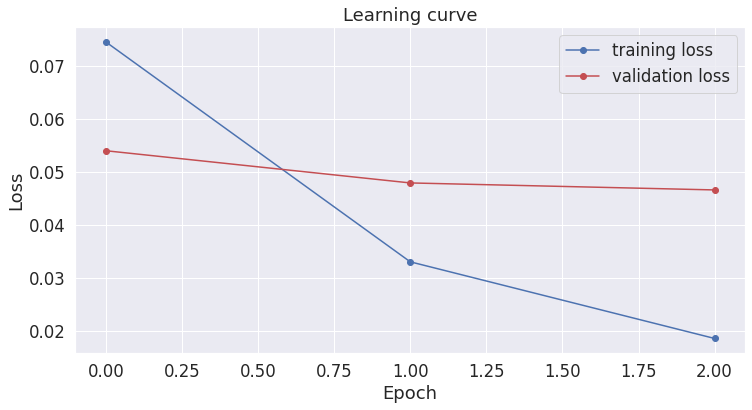

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

# Use plot styling from seaborn.
sns.set(style='darkgrid')

# Increase the plot size and font size.
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)

# Plot the learning curve.
plt.plot(loss_values, 'b-o', label="training loss")
plt.plot(validation_loss_values, 'r-o', label="validation loss")

# Label the plot.
plt.title("Learning curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [195]:
test_sentence=["前天昨天哪一天","我不知道"]

In [196]:
tokenized_sentence = tokenizer.encode(test_sentence[0])
input_ids = torch.tensor([tokenized_sentence]).cuda()
len(tokenized_sentence)

9

In [197]:
#tokenized_sentence

In [198]:
with torch.no_grad():
    output = model(input_ids)
label_indices = np.argmax(output[0].to('cpu').numpy(), axis=2)

In [199]:
input_ids

tensor([[ 101, 1184, 1921, 3219, 1921, 1525,  671, 1921,  102]],
       device='cuda:0')

In [200]:
tokens = tokenizer.convert_ids_to_tokens(input_ids.to('cpu').numpy()[0])
new_tokens, new_labels = [], []
for token, label_idx in zip(tokens, label_indices[0]):
    if token.startswith("##"):
        new_tokens[-1] = new_tokens[-1] + token[2:]
    else:
        new_labels.append(tag_values[label_idx])
        new_tokens.append(token)

In [201]:
tokens

['[CLS]', '前', '天', '昨', '天', '哪', '一', '天', '[SEP]']

In [202]:
#tag_values

In [203]:
#new_labels

In [204]:
label_indices[0]

array([11,  1, 26, 11, 26, 11, 11, 11, 11])

In [205]:
for token, label in zip(new_tokens, new_labels):
    print("{}\t{}".format(token,label))

[CLS]	O
前	B-TIME
天	I-TIME
昨	O
天	I-TIME
哪	O
一	O
天	O
[SEP]	O


### 可多筆輸出

In [206]:
for i in range(len(val_inputs)):
    input_ids=val_inputs[i]
    tokens = tokenizer.convert_ids_to_tokens(input_ids.to('cpu').numpy())
    new_tokens, new_labels = [], []
    for token, label_idx in zip(tokens, val_tags[0]):
        #print(token)
        #if token=='[PAD]':
        #    break
        if token.startswith("##"):
            new_tokens[-1] = new_tokens[-1] + token[2:]
        else:
            new_labels.append(tag_values[label_idx])
            new_tokens.append(token)
    for token, label in zip(new_tokens, new_labels):
        print("{}\t{}".format(token,label))

，	O
就	O
是	O
男	O
同	O
志	O
族	O
群	O
裡	O
面	O
有	O
做	O
這	O
樣	O
的	O
研	O
究	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

，	O
我	O
們	O
那	O
個	O
診	O
所	O
有	O
。	O
醫	O
師	O
：	O
那	O
就	O
不	O
用	O
了	O
。	PAD
家	PAD
屬	PAD
：	PAD
啊	PAD
不	PAD
然	PAD
我	PAD
們	PAD
要	PAD
不	PAD
要	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
改	O
成	O
d	O
a	O
i	O
l	O
y	O
對	O
不	O
對	O
？	O
民	O
眾	O
：	O
對	O
。	O
個	PAD
管	PAD
師	PAD
：	PAD
然	PAD
後	PAD
那	PAD
時	PAD
候	PAD
是	PAD
因	PAD
為	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
啊	O
你	O
就	O
血	O
壓	O
的	O
不	O
用	O
開	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
1	O
月	O
7	O
號	O
開	O
始	O
看	O
門	O
診	O
嘛	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
一	O
歲	O
。	O
民	O
眾	O
：	O
問	O
題	O
是	O
她	O
那	O
個	O
骨	O
頭	O
發	O
育	O
不	PAD
全	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
數	O
量	O
增	O
加	O
。	O
民	O
眾	O
：	O
我	O
那	O
個	O
也	O
是	O
比	O
較	O
多	O
。	PAD
醫	PAD
師	PAD
：	PAD
對	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
你	O
在	O
急	O
診	O
嘛	O
對	O
不	O
對	O
？	O
民	O
眾	O
：	O
喔	O
沒	O
有	O
我	O
現	PAD
在	PAD
換	PAD
去	PAD
[UNK]	PAD
[UNK]	PAD
[UNK]	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
好	PAD
那	PAD
會	PAD
不	PAD
會	PAD
讓	PAD
你	PAD
就	PAD
是	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
因	O
為	O
上	O
次	O
你	O
叫	O
我	O
去	O
拿	O
給	O
護	O
理	O
師	O
。	O
民	O
眾	O
：	PAD
以	PAD
前	PAD
那	PAD
個	PAD
化	PAD
療	PAD
的	PAD
醫	PAD
師	PAD
啦	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
對	O
。	O
民	O
眾	O
：	O
有	O
要	O
開	O
單	O
子	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
不	O
是	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
對	O
就	O
是	O
一	O
般	O
都	O
會	O
記	O
得	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
啊	O
你	O
會	O
擔	O
心	O
嗎	O
？	O
民	O
眾	O
：	O
會	O
喔	O
。	O
醫	O
師	O
：	O
啊	PAD
這	PAD
次	PAD
不	PAD
要	PAD
等	PAD
半	PAD
年	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
然	O
後	O
最	O
後	O
等	O
不	O
到	O
兩	O
小	O
時	O
然	O
後	O
什	O
麼	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
啊	O
有	O
些	O
時	O
候	O
排	O
不	O
開	O
。	O
醫	O
師	O
：	O
這	O
樣	O
喔	O
。	O
民	PAD
眾	PAD
：	PAD
因	PAD
為	PAD
我	PAD
平	PAD
常	PAD
給	PAD
他	PAD
看	PAD
他	PAD
都	PAD
一	PAD
點	PAD
就	PAD
幫	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
它	O
也	O
會	O
慢	O
慢	O
消	O
失	O
啊	O
。	O
民	O
眾	O
：	O
可	O
是	O
它	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
好	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

，	O
這	O
種	O
效	O
果	O
是	O
最	O
差	O
的	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
有	O
時	O
候	O
藥	O
停	O
了	O
之	O
後	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
都	O
會	O
無	O
套	O
嗎	O
？	O
民	O
眾	O
：	O
以	O
前	O
就	O
是	O
自	O
己	O
[UNK]	O
[UNK]	PAD
自	PAD
己	PAD
的	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
覺	O
得	O
我	O
想	O
要	O
那	O
個	O
[UNK]	O
[UNK]	O
醫	O
師	O
：	O
你	O
覺	O
得	O
你	PAD
會	PAD
繼	PAD
續	PAD
堅	PAD
持	PAD
下	PAD
去	PAD
。	PAD
民	PAD
眾	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
你	O
這	O
個	O
。	O
護	O
理	O
師	O
：	O
怎	O
麼	O
？	O
醫	O
師	O
：	O
狀	O
況	O
蠻	PAD
多	PAD
的	PAD
。	PAD
護	PAD
理	PAD
師	PAD
：	PAD
對	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
可	O
是	O
我	O
媽	O
跟	O
我	O
妹	O
是	O
希	O
望	O
說	O
我	O
先	O
在	O
內	O
科	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
十	O
根	O
手	O
指	O
頭	O
數	O
得	O
出	O
來	O
吧	O
。	O
個	O
管	O
師	O
：	O
哦	O
那	PAD
真	PAD
的	PAD
不	PAD
多	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
這	O
個	O
我	O
會	O
再	O
追	O
蹤	O
好	O
不	O
好	O
？	O
因	O
爲	O
有	O
個	O
[UNK]	O
[UNK]	PAD
[UNK]	PAD
指	PAD
數	PAD
這	PAD
樣	PAD
子	PAD
。	PAD
不	PAD
過	PAD
她	PAD
已	PAD
經	PAD
高	PAD
齡	PAD
了	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
過	O
二	O
十	O
四	O
小	O
時	O
。	O
個	O
管	O
師	O
：	O
八	O
點	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
都	O
吃	O
便	O
當	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
還	O
是	O
朋	O
友	O
介	O
紹	O
？	O
民	O
眾	O
：	O
對	O
。	O
個	O
管	O
師	O
：	O
交	PAD
友	PAD
軟	PAD
體	PAD
認	PAD
識	PAD
的	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
就	O
每	O
次	O
回	O
診	O
的	O
時	O
候	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
你	O
就	O
是	O
會	O
一	O
直	O
在	O
。	O
民	O
眾	O
：	O
嗯	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
剛	O
剛	O
好	O
在	O
心	O
臟	O
旁	O
邊	O
。	O
民	O
眾	O
：	O
恩	O
。	O
醫	O
師	O
：	PAD
剛	PAD
好	PAD
在	PAD
胃	PAD
的	PAD
旁	PAD
邊	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

，	O
這	O
是	O
其	O
一	O
。	O
第	O
二	O
個	O
就	O
是	O
它	O
會	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
詳	O
實	O
記	O
錄	O
這	O
樣	O
。	O
阿	O
但	O
是	O
因	O
為	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
應	O
該	O
是	O
說	O
你	O
感	O
覺	O
比	O
較	O
舒	O
服	O
的	O
時	O
候	O
你	O
就	O
不	PAD
會	PAD
想	PAD
要	PAD
戴	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
對	PAD
。	PAD
個	PAD
管	PAD
師	PAD
[PAD]	PAD
[P

，	O
其	O
實	O
好	O
像	O
也	O
沒	O
幹	O
嘛	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
不	O
會	O
有	O
聲	O
音	O
。	O
民	O
眾	O
：	O
哈	O
哈	O
哈	O
。	O
個	O
管	O
師	O
：	PAD
等	PAD
一	PAD
下	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
這	PAD
兩	PAD
個	PAD
月	PAD
還	PAD
好	PAD
嗎	PAD
？	PAD
民	PAD
眾	PAD
：	PAD
嗯	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
嗯	PAD
是	PAD
怎	PAD
樣	PAD
？	PAD
民	PAD
眾	PAD
：	PAD
還	PAD
好	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
所	PAD
以	PAD
你	PAD
改	PAD
成	PAD
任	PAD
務	PAD
型	PAD
？	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
什	PAD
麼	PAD
時	PAD
候	PAD
改	PAD
的	PAD
？	PAD
民	PAD
眾	PAD
：	PAD
就	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

，	O
為	O
什	O
麼	O
我	O
要	O
那	O
個	O
。	O
個	O
管	O
師	O
：	O
就	O
做	O
完	O
之	O
後	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
他	O
十	O
一	O
點	O
過	O
後	O
然	O
後	O
來	O
我	O
家	O
幹	O
嘛	O
。	O
個	O
管	O
師	PAD
：	PAD
喔	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
阿	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

，	O
我	O
們	O
早	O
上	O
來	O
抽	O
阿	O
。	O
醫	O
師	O
：	O
好	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
所	O
以	O
就	O
不	O
會	O
想	O
要	O
去	O
從	O
事	O
。	O
個	O
管	O
師	O
：	O
就	O
是	PAD
6	PAD
9	PAD
、	PAD
0	PAD
1	PAD
這	PAD
樣	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

，	O
不	O
過	O
當	O
然	O
就	O
是	O
說	O
保	O
險	O
起	O
見	O
的	O
話	O
是	O
1	O
個	O
禮	PAD
拜	PAD
啦	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
嗯	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
所	PAD
以	PAD
你	PAD
在	PAD
第	PAD
一	PAD
個	PAD
月	PAD
天	PAD
天	PAD
吃	PAD
一	PAD
顆	PAD
的	PAD
時	PAD
候	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
幫	O
我	O
約	O
我	O
比	O
較	O
會	O
記	O
得	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
[UNK]	O
[UNK]	O
4	O
到	O
4	O
9	O
0	O
。	O
醫	O
師	O
：	O
4	O
9	O
0	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

個	O
管	O
師	O
：	O
好	O
喔	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
所	O
以	O
我	O
們	O
不	O
能	O
賣	O
學	O
名	O
藥	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
最	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

，	O
睡	O
起	O
來	O
突	O
然	O
這	O
個	O
樣	O
子	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
但	O
是	O
就	O
是	O
一	O
定	O
要	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
調	O
一	O
下	O
之	O
前	O
的	O
指	O
數	O
齁	O
。	O
所	O
以	O
維	O
持	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
那	O
她	O
本	O
人	O
就	O
不	O
用	O
來	O
？	O
醫	O
師	O
：	O
對	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
因	O
為	O
可	O
以	O
正	O
負	O
一	O
個	O
小	O
時	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
好	O
哦	O
？	O
民	O
衆	O
：	O
4	O
月	O
1	O
7	O
？	O
醫	O
師	O
：	O
提	O
早	O
打	PAD
應	PAD
該	PAD
o	PAD
k	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
不	O
要	O
再	O
那	O
個	O
[UNK]	O
[UNK]	O
民	O
眾	O
：	O
肚	O
子	O
比	O
較	O
大	O
哈	O
哈	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
哈	PAD
哈	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
哦	O
真	O
的	O
喔	O
又	O
有	O
點	O
積	O
水	O
了	O
。	O
家	O
屬	O
：	O
啊	O
他	O
是	PAD
說	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
但	PAD
是	PAD
不	PAD
吃	PAD
不	PAD
行	PAD
欸	PAD
。	PAD
家	PAD
屬	PAD
：	PAD
請	PAD
問	PAD
一	PAD
下	PAD
像	PAD
你	PAD
這	PAD
樣	PAD
看	PAD
齁	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
有	PAD
積	PAD
水	PAD
。	PAD
家	PAD
屬	PAD
：	PAD
有	PAD
積	PAD
水	PAD
喔	PAD
？	PAD
這	PAD
樣	PAD
說	PAD
是	PAD
我	PAD
們	PAD
也	PAD
變	PAD
成	PAD
說	PAD
一	PAD
直	PAD
說	PAD
在	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
你	PAD
水	PAD
反	PAD
而	PAD
會	PAD
不	PAD
會	PAD
吃	PAD
太	PAD
多	PAD
？	PAD
家	PAD
屬	PAD
：	PAD
蛤	PAD
？	PAD
醫	PAD
師	PAD
：	PAD
水	PAD
會	PAD
不	PAD
會	PAD
吃	PAD
太	PAD
多	PAD
？	PAD
家	PAD
屬	PAD
：	PAD
水	PAD
是	PAD
他	PAD
也	PAD
是	PAD
還	PAD
好	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
吃	PAD
太	PAD
鹹	PAD
也	PAD
不	PAD
行	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
因	PAD
為	PAD
這	PAD
樣	PAD
的	PAD


，	O
二	O
還	O
是	O
三	O
了	O
吧	O
。	O
醫	O
師	O
：	O
我	O
看	O
一	O
下	O
哦	O
。	O
一	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
所	O
以	O
我	O
們	O
那	O
個	O
尿	O
酸	O
的	O
藥	O
要	O
繼	O
續	O
吃	O
齁	O
。	O
民	PAD
眾	PAD
：	PAD
這	PAD
種	PAD
喔	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
偶	O
爾	O
帶	O
套	O
？	O
民	O
眾	O
：	O
對	O
。	O
個	O
管	O
師	O
：	O
[UNK]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
可	O
是	O
之	O
前	O
會	O
腫	O
腫	O
的	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
應	O
該	O
說	O
理	O
論	O
上	O
大	O
家	O
的	O
那	O
個	O
安	O
全	O
範	O
圍	O
蠻	O
高	PAD
的	PAD
啦	PAD
。	PAD
比	PAD
如	PAD
說	PAD
你	PAD
漏	PAD
了	PAD
一	PAD
天	PAD
他	PAD
雖	PAD
然	PAD
掉	PAD
下	PAD
來	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
那	O
個	O
是	O
水	O
泡	O
嘛	O
。	O
民	O
眾	O
：	O
恩	O
。	O
醫	O
師	O
：	O
水	O
泡	PAD
本	PAD
來	PAD
就	PAD
會	PAD
殘	PAD
水	PAD
阿	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
恩	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
是	PAD
阿	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
所	O
以	O
你	O
是	O
引	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
有	O
點	O
不	O
太	O
正	O
常	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
就	O
是	O
除	O
了	O
我	O
跟	O
你	O
講	O
這	O
兩	O
個	O
狀	O
況	O
你	O
不	O
確	O
定	PAD
是	PAD
不	PAD
是	PAD
藥	PAD
物	PAD
造	PAD
成	PAD
的	PAD
話	PAD
你	PAD
就	PAD
是	PAD
在	PAD
[UNK]	PAD
[UNK]	PAD
[UNK]	PAD
[UNK]	PAD
上	PAD
詢	PAD
問	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
他	O
講	O
沒	O
有	O
我	O
也	O
不	O
曉	O
得	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
所	O
以	O
也	O
沒	O
有	O
用	O
過	O
？	O
民	O
眾	O
：	O
沒	O
有	O
。	O
醫	O
師	O
：	PAD
[UNK]	PAD
[UNK]	PAD
好	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
把	O
它	O
壓	O
下	O
去	O
至	O
樣	O
子	O
。	O
民	O
眾	O
：	O
好	O
啊	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
有	O
比	O
較	O
好	O
的	O
那	O
個	O
可	O
以	O
開	O
胃	O
的	O
藥	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
你	O
的	O
那	O
個	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
都	O
有	O
照	O
過	O
[UNK]	O
。	O
醫	O
師	O
：	O
喔	O
真	O
的	O
喔	O
？	O
民	O
眾	PAD
：	PAD
恩	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
還	O
是	O
吐	O
了	O
三	O
次	O
。	O
醫	O
師	O
：	O
吐	O
了	O
三	O
次	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
手	O
上	O
有	O
這	O
麽	O
多	O
個	O
案	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
啊	O
然	O
後	O
他	O
也	O
說	O
他	O
沒	O
有	O
？	O
個	O
管	O
師	O
：	O
對	O
啊	O
。	PAD
民	PAD
眾	PAD
：	PAD
好	PAD
吧	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
有	O
跟	O
他	O
講	O
說	O
不	O
能	O
吃	O
這	O
樣	O
。	O
醫	O
師	O
：	O
是	O
。	PAD
家	PAD
屬	PAD
：	PAD
所	PAD
以	PAD
其	PAD
實	PAD
有	PAD
這	PAD
種	PAD
因	PAD
素	PAD
齁	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
不	O
能	O
太	O
[UNK]	O
[UNK]	O
不	O
要	O
馬	O
上	O
吃	O
那	O
個	O
抗	O
生	O
素	O
。	O
民	PAD
眾	PAD
：	PAD
恩	PAD
喔	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
齁	PAD
。	PAD
民	PAD
眾	PAD
：	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
來	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
它	O
可	O
以	O
去	O
預	O
防	O
很	O
多	O
的	O
疾	O
病	O
。	O
民	O
眾	O
：	O
嗯	O
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
我	PAD
講	PAD
的	PAD
是	PAD
百	PAD
分	PAD
之	PAD
百	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
可	O
以	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
等	O
下	O
千	O
尋	O
會	O
告	O
訴	O
你	O
甚	O
麼	O
時	O
候	O
要	O
抽	O
血	O
。	O
民	PAD
眾	PAD
：	PAD
[UNK]	PAD
[UNK]	PAD
。	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
然	O
後	O
如	O
果	O
抗	O
藥	O
性	O
的	O
話	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
對	O
。	O
個	O
管	O
師	O
：	O
4	O
月	O
1	O
2	O
餒	O
。	O
民	O
眾	O
：	O
真	O
的	PAD
嗎	PAD
？	PAD
個	PAD
管	PAD
師	PAD
：	PAD
對	PAD
阿	PAD
4	PAD
月	PAD
1	PAD
2	PAD
阿	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
那	PAD
五	PAD
月	PAD
份	PAD
來	PAD
的	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
4	PAD
月	PAD
1	PAD
2	PAD
買	PAD
1	PAD
8	PAD
0	PAD
顆	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
這	O
次	O
[UNK]	O
[UNK]	O
這	O
次	O
的	O
開	O
單	O
子	O
要	O
有	O
了	O
齁	O
。	O
民	O
眾	PAD
：	PAD
喔	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
好	PAD
齁	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
這	PAD
次	PAD
全	PAD
驗	PAD
了	PAD
就	PAD
對	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
全	PAD
驗	PAD
了	PAD
全	PAD
驗	PAD
。	PAD
有	PAD
時	PAD
候	PAD
我	PAD
們	PAD
驗	PAD
太	PAD
頻	PAD
繁	PAD
我	PAD
們	PAD
也	PAD
會	PAD
要	PAD
寫	PAD
報	PAD
告	PAD
餒	PAD
哈	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
哈	PAD
哈	PAD
哈	PAD
哈	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
知	PAD
道	PAD
嗎	PAD
哈	PAD
哈	PAD
哈	PAD
？	PAD
很	PAD
煩	PAD
哈	PAD
哈	PAD
哈	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
最	PAD
討	PAD
厭	PAD
寫	PAD
報	PAD
告	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
就	PAD
有	PAD
時	PAD
候	PAD
他	PAD
就	PAD
會	PAD
抽	PAD
查	PAD
說	PAD
你	PAD
為	PAD
甚	PAD
麼	PAD
[UNK]	PAD
[UNK]	PAD
欸	PAD
都	PAD
那	PAD
麼	PAD
好	PAD
你	PAD
一	PAD
直	PAD
給	PAD
他	PAD
驗	PAD
這	PAD
樣	PAD
哈	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
也	PAD
是	PAD
追	PAD
蹤	PAD
嘛	PAD
。	PAD
醫	PAD
師	PAD
：	PAD
是	PAD
阿	PAD
我	PAD
就	PAD
寫	PAD
說	PAD
要	PAD
追	PAD
蹤	PAD
哈	PAD
哈	PAD
哈	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
一	O
次	O
吃	O
兩	O
顆	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

，	O
然	O
後	O
那	O
次	O
是	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
，	O
好	O
。	O
個	O
管	O
師	O
：	O
所	O
以	O
回	O
歸	O
到	O
還	O
是	O
保	O
護	O
自	O
己	PAD
。	PAD
民	PAD
眾	PAD
：	PAD
[UNK]	PAD
[UNK]	PAD
。	PAD
個	PAD
管	PAD
師	PAD
：	PAD
[UNK]	PAD
[UNK]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
然	O
後	O
因	O
為	O
那	O
個	O
就	O
是	O
也	O
不	O
用	O
等	O
啦	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


，	O
有	O
一	O
個	O
狀	O
態	O
是	O
對	O
我	O
們	O
比	O
較	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[P

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
對	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD]	O
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
，	O
我	O
開	O
開	O
看	O
。	O
但	O
是	O
我	O
會	O
把	O
你	O
註	O
明	O
說	O
齁	O
[PAD]	O
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PA

，	O
阿	O
但	O
是	O
有	O
性	O
行	O
為	O
嗎	O
？	O
民	O
眾	O
：	O
沒	O
有	O
。	O
個	O
管	PAD
師	PAD
：	PAD
沒	PAD
有	PAD
性	PAD
行	PAD
為	PAD
？	PAD
民	PAD
眾	PAD
：	PAD
對	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD

[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD
[PAD]	PAD


In [209]:
for i in range(len(test_sentence)):
    tokenized_sentence = tokenizer.encode(test_sentence[i])
    input_ids = torch.tensor([tokenized_sentence]).cuda()
    with torch.no_grad():
        output = model(input_ids)
    label_indices = np.argmax(output[0].to('cpu').numpy(), axis=2)
    tokens = tokenizer.convert_ids_to_tokens(input_ids.to('cpu').numpy()[0])
    new_tokens, new_labels = [], []
    for token, label_idx in zip(tokens, label_indices[0]):
        if token.startswith("##"):
            new_tokens[-1] = new_tokens[-1] + token[2:]
        else:
            new_labels.append(tag_values[label_idx])
            new_tokens.append(token)
    for token, label in zip(new_tokens, new_labels):
        print("{}\t{}".format(token,label))

[CLS]	O
前	B-TIME
天	I-TIME
昨	O
天	I-TIME
哪	O
一	O
天	O
[SEP]	O
[CLS]	O
我	O
不	O
知	O
道	O
[SEP]	O
